In [3]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2

import warnings
warnings.filterwarnings('ignore')
import os
for dirname, _, _ in os.walk('D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET'):
        print(dirname)

D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TEST
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TEST\O
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TEST\R
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TRAIN
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TRAIN\O
D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET\TRAIN\R


In [5]:
train_path = "D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET/TRAIN/"
test_path = "D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET/TEST/"

In [7]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model
from glob import glob


In [8]:
x_data = [] 
y_data = [] 

for category in glob(train_path+'/*'):
    for file in tqdm(glob(category+'/*')):
        img_array=cv2.imread(file)
        img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
        x_data.append(img_array) 
        y_data.append(category.split("/")[-1])
        
data=pd.DataFrame({'image': x_data,'label': y_data})

100%|██████████| 9999/9999 [00:48<00:00, 207.74it/s]


In [10]:
data.shape

(22577, 2)

In [11]:
from collections import Counter
Counter(y_data)

Counter({'TRAIN\\O': 12578, 'TRAIN\\R': 9999})

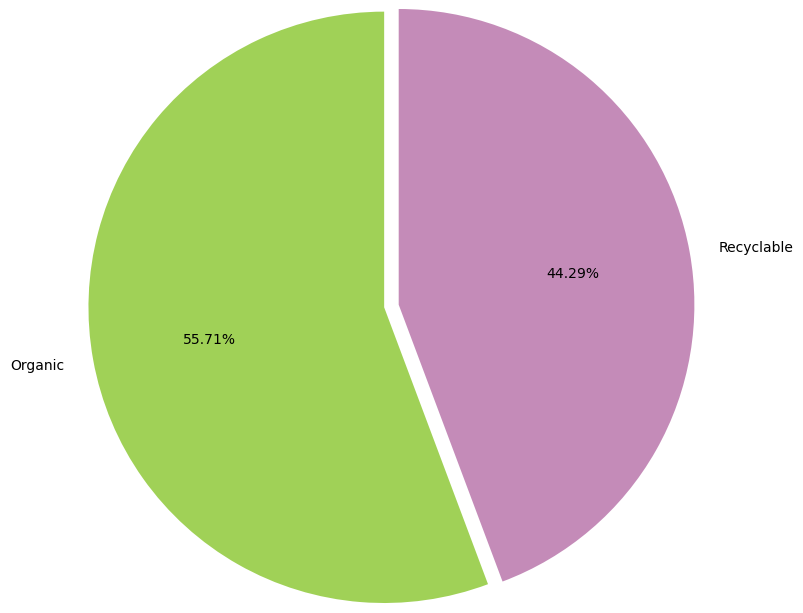

In [12]:
colors = ['#a0d157','#c48bb8']
plt.pie(data.label.value_counts(),startangle=90,explode=[0.05,0.05],autopct='%0.2f%%',
        labels=['Organic', 'Recyclable'], colors= colors,radius=2)
plt.show()

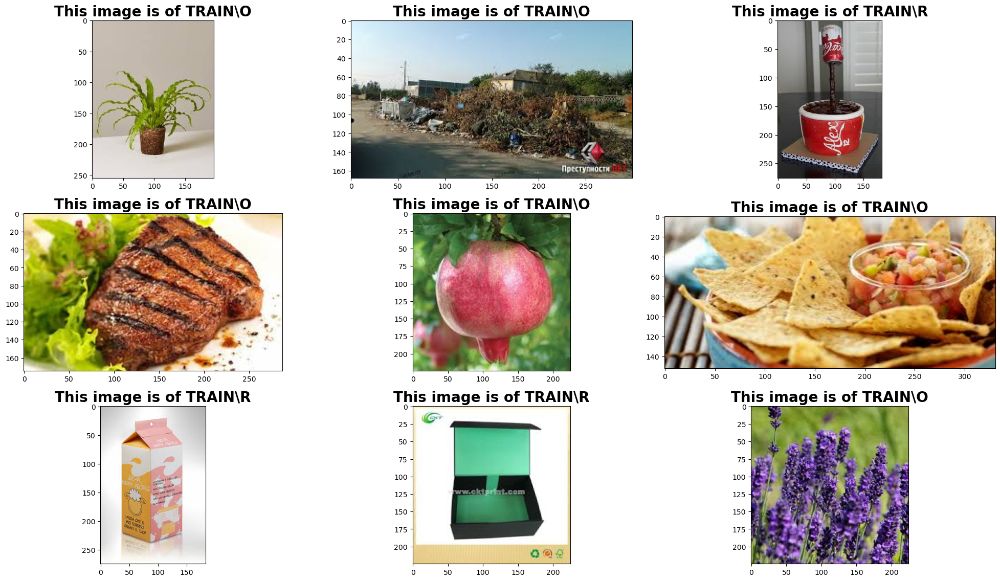

In [13]:
plt.figure(figsize=(20,15))
for i in range(9):
    plt.subplot(4,3,(i%12)+1)
    index=np.random.randint(15000)
    plt.title('This image is of {0}'.format(data.label[index]),fontdict={'size':20,'weight':'bold'})
    plt.imshow(data.image[index])
    plt.tight_layout()

In [14]:
className = glob(train_path + '/*' )
numberOfClass = len(className)
print("Number Of Class: ",numberOfClass)

Number Of Class:  2


In [15]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model
from glob import glob

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3)))
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Conv2D(64, (3, 3)))  
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Conv2D(128, (3, 3)))
model.add(Activation("relu"))
model.add(MaxPooling2D())

model.add(Flatten())
model.add(Dense(256))
model.add(Activation("relu"))
model.add(Dropout(0.5))
model.add(Dense(64))
model.add(Activation("relu"))
model.add(Dropout(0.5))
model.add(Dense(numberOfClass)) # output
model.add(Activation("sigmoid"))

model.compile(loss="binary_crossentropy",
              optimizer="adam",
              metrics=["accuracy"])

batch_size = 256

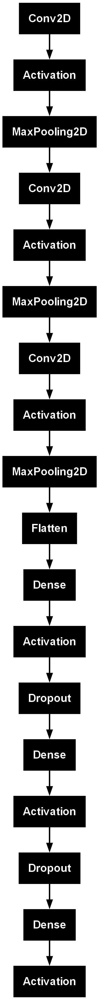

In [16]:
plot_model(model)

In [17]:
train_datagen = ImageDataGenerator(rescale= 1./255)


In [18]:
test_datagen = ImageDataGenerator(rescale= 1./255)


In [19]:
train_generator = train_datagen.flow_from_directory(
        train_path, 
        target_size= (224,224),
        batch_size = batch_size,
        color_mode= "rgb",
        class_mode= "categorical")

test_generator = test_datagen.flow_from_directory(
        test_path, 
        target_size= (224,224),
        batch_size = batch_size,
        color_mode= "rgb",
        class_mode= "categorical")

Found 22577 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.


In [20]:
hist = model.fit(
    train_generator,
    epochs=5,
    validation_data=test_generator
)

Epoch 1/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 792s 9s/step - accuracy: 0.7007 - loss: 0.6883 - val_accuracy: 0.8687 - val_loss: 0.3572
Epoch 2/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 994s 11s/step - accuracy: 0.8257 - loss: 0.4271 - val_accuracy: 0.8882 - val_loss: 0.2981
Epoch 3/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 843s 9s/step - accuracy: 0.8471 - loss: 0.3823 - val_accuracy: 0.8890 - val_loss: 0.2960
Epoch 4/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 848s 9s/step - accuracy: 0.8655 - loss: 0.3380 - val_accuracy: 0.8902 - val_loss: 0.2935
Epoch 5/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 967s 11s/step - accuracy: 0.8766 - loss: 0.3069 - val_accuracy: 0.8953 - val_loss: 0.2821


In [199]:
model.save("D:/Artificial Intelligence/Automated Recycle Bin/bin_model_v4.keras")

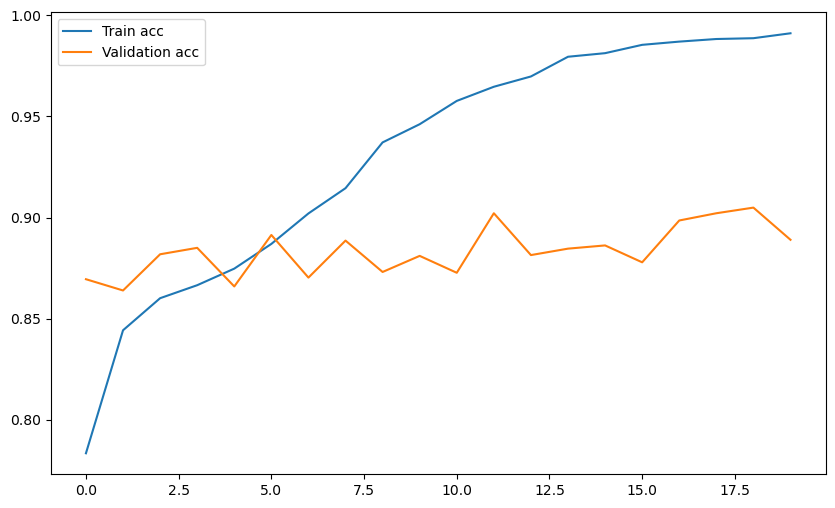

In [200]:
plt.figure(figsize=[10,6])
plt.plot(hist.history["accuracy"], label = "Train acc")
plt.plot(hist.history["val_accuracy"], label = "Validation acc")
plt.legend()
plt.show()

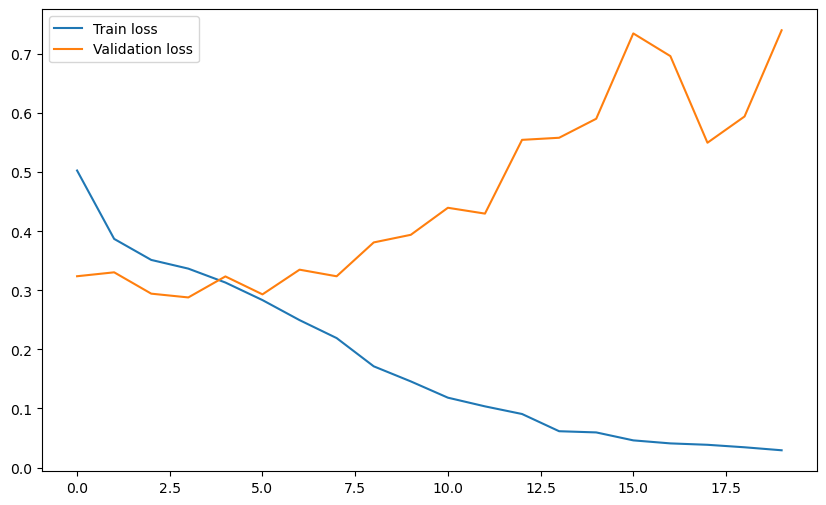

In [201]:
plt.figure(figsize=(10,6))
plt.plot(hist.history['loss'], label = "Train loss")
plt.plot(hist.history['val_loss'], label = "Validation loss")
plt.legend()
plt.show()

In [202]:
def predict_func(img): 
    plt.figure(figsize=(6,4))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.tight_layout()
    img = cv2.resize(img, (224, 224))
    img = np.reshape(img, [-1, 224, 224,3])
    result = np.argmax(model.predict(img))
    if result == 0: print("\033[94m"+"This image -> Recyclable"+"\033[0m")
    elif result ==1: print("\033[94m"+"This image -> Organic"+"\033[0m")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
This image -> Organic


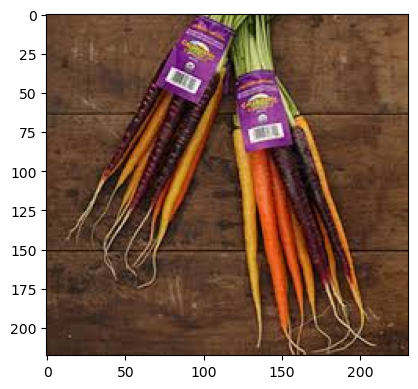

In [203]:
test_img = cv2.imread("D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET/TEST/O/O_12573.jpg")
predict_func(test_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
This image -> Recyclable


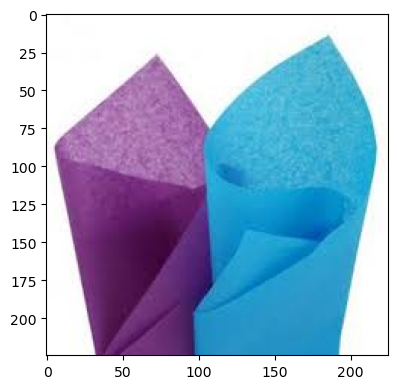

In [204]:
test_img = cv2.imread("D:/Artificial Intelligence/Automated Recycle Bin/dataset/DATASET/TEST/R/R_10753.jpg")
predict_func(test_img)

Testing image: D:/Artificial Intelligence/Test Data/106155.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
Testing image: D:/Artificial Intelligence/Test Data/2020-05-10-16-38-24_wMl2mhWj9jproduct.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Testing image: D:/Artificial Intelligence/Test Data/31bp0fXXE8L.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Testing image: D:/Artificial Intelligence/Test Data/3520_428fd902f4247199467725e7eccf1673.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Testing image: D:/Artificial Intelligence/Test Data/360_F_350368788_Vf11waoSZydNsaused565azGcnrgCs6Y.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Testing image: D:/Artificial Intelligence/Test Data/5df8ee0cdd9c093359b48e25575a36f1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Testing image: D:/Artificial Intelligence/Test Data/Batteries-Hero-Image.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
Testing image: D:/Artificial Intelligence/Test Data/Batteries.gif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Testing image: D:/Artificial Intellige

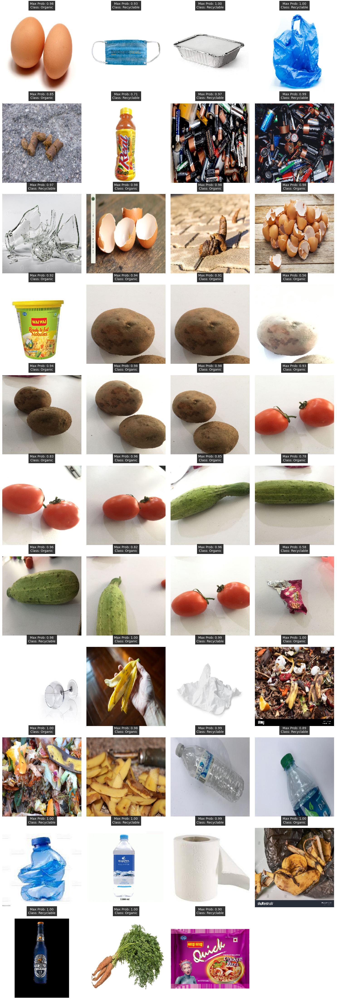

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Load your newly trained model (modify the path to your model)
model = load_model('D:/Artificial Intelligence/Automated Recycle Bin/bin_model_v2.keras')

# Define the waste labels and create a reverse mapping
waste_labels = {"Organic": 0, "Recyclable": 1}
reverse_waste_labels = {v: k for k, v in waste_labels.items()}

def CNN_model_testing(path):
    img = image.load_img(path, target_size=(224, 224))  # Ensure target_size matches your model's input
    img = image.img_to_array(img, dtype=np.uint8)
    img = np.array(img) / 255.0
    p = model.predict(img.reshape(1, 224, 224, 3))
    predicted_class = np.argmax(p[0])
    return img, p, predicted_class

def plot_model_testing(img, p, predicted_class, ax):
    ax.axis("off")
    ax.imshow(img.squeeze())
    # Add text with black background and white font at the top of the image
    text = "Max Prob: {:.2f}\nClass: {}".format(np.max(p[0]), reverse_waste_labels[predicted_class])
    ax.text(0.5, 1.05, text, fontsize=10, color='white', ha='center', va='bottom',
            transform=ax.transAxes, bbox=dict(facecolor='black', alpha=0.8))

# Directory containing test images
test_folder_path = "D:/Artificial Intelligence/Test Data/"

# Collect all image paths
image_paths = []
for root, dirs, files in os.walk(test_folder_path):
    for file in files:
        if file.endswith(('jpg', 'jpeg', 'png', 'gif')):  # Adjust file extensions as needed
            file_path = os.path.join(root, file)
            image_paths.append(file_path)

# Plot images in a 4-column grid
num_images = len(image_paths)
num_cols = 4
num_rows = (num_images + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))
axes = axes.flatten()

for idx, file_path in enumerate(image_paths):
    print(f"Testing image: {file_path}")
    img, p, predicted_class = CNN_model_testing(file_path)
    plot_model_testing(img, p, predicted_class, axes[idx])

# Hide any remaining empty subplots
for ax in axes[num_images:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from imageai.Detection import ObjectDetection
import os
import tensorflow as tf
from PIL import Image
import numpy as np
import cv2
from keras.models import load_model
from keras.preprocessing import image
import serial  # Import the serial library for communication with Arduino

# Load your trained classification model
classification_model = load_model('D:/Artificial Intelligence/Automated Recycle Bin/bin_model_v3.keras')

# Define the waste labels and create a reverse mapping
waste_labels = {"Organic": 0, "Recyclable": 1}
reverse_waste_labels = {v: k for k, v in waste_labels.items()}

# Function to preprocess images for TensorFlow model
def preprocess_image(image):
    img = image.resize((224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    return img_array

# Set up ObjectDetection with YOLOv3
execution_path = os.getcwd()
detector = ObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath(os.path.join(execution_path, "D:/Artificial Intelligence/yolov3.pt"))
detector.loadModel()

# Open a connection to the webcam
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: Could not open video stream.")
    exit()

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_path = os.path.join(execution_path, 'D:/Artificial Intelligence/output.avi')
out = cv2.VideoWriter(output_path, fourcc, 20.0, (640, 480))

# Serial communication setup
ser = serial.Serial('COM4', 9600)  # Change 'COM3' to your Arduino's serial port

while True:
    ret, frame = cap.read()
    if not ret:
        print("Error: Failed to capture image")
        break

    # Save the current frame to disk for YOLOv3 detection
    frame_path = os.path.join(execution_path, "current_frame.jpg")
    cv2.imwrite(frame_path, frame)

    # Perform object detection
    detections = detector.detectObjectsFromImage(input_image=frame_path,
                                                 output_image_path=os.path.join(execution_path, "current_frame_output.jpg"),
                                                 minimum_percentage_probability=30)

    # Reload the frame with detections drawn
    img = cv2.imread(os.path.join(execution_path, "current_frame_output.jpg"))

    for eachObject in detections:
        name = eachObject["name"]
        percentage_probability = eachObject["percentage_probability"]
        box_points = eachObject["box_points"]

        # Print detected class names
        print(f"Detected: {name}")

        # Draw bounding box
        x1, y1, x2, y2 = box_points
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # Extract region of interest (ROI) for TensorFlow model prediction
        roi = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)).crop((x1, y1, x2, y2))
        roi_array = preprocess_image(roi)

        # Make predictions with TensorFlow model
        predictions = classification_model.predict(roi_array)
        predicted_class = np.argmax(predictions[0])

        # Draw label with predicted class
        cv2.putText(img, f"Class: {reverse_waste_labels[predicted_class]}", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        print(f"Predicted Class: {reverse_waste_labels[predicted_class]}")
        print("--------------------------------")

        # Send predicted class to Arduino via serial communication
        ser.write(reverse_waste_labels[predicted_class].encode())

    # Write the frame with detections
    out.write(img)

    # Display the image with detections
    cv2.imshow('Object Detection', img)

    # Check for 'q' key press to break the loop
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close all OpenCV windows
cap.release()
out.release()
cv2.destroyAllWindows()


In [12]:
import serial
import time

try:

    ser = serial.Serial('COM4', 9600) 
    time.sleep(2)
    ser.write(b'2') 

    print("Signal sent successfully.")

except serial.SerialException as e:
    print(f"Error opening serial port: {e}")

finally:
    # Ensure the serial connection is closed
    try:
        if ser.is_open:
            ser.close()
            print("Serial connection closed.")
    except NameError:
        print("Serial port was never opened.")



Signal sent successfully.
Serial connection closed.


In [4]:
from imageai.Detection import ObjectDetection
import os
import tensorflow as tf
from PIL import Image
import numpy as np
import cv2
from keras.models import load_model
import serial
import time

# Load your trained classification model
classification_model = load_model('D:/Artificial Intelligence/Automated Recycle Bin/bin_model_v3.keras')

# Define the waste labels and create a reverse mapping
waste_labels = {"Organic": 0, "Recyclable": 1}
reverse_waste_labels = {v: k for k, v in waste_labels.items()}

# Function to preprocess images for TensorFlow model
def preprocess_image(image):
    img = image.resize((224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    return img_array

# Set up ObjectDetection with YOLOv3
execution_path = os.getcwd()
detector = ObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath(os.path.join(execution_path, "D:/Artificial Intelligence/yolov3.pt"))
detector.loadModel()

# Open a connection to the webcam
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Error: Could not open video stream.")
    exit()

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_path = os.path.join(execution_path, 'D:/Artificial Intelligence/output.avi')
out = cv2.VideoWriter(output_path, fourcc, 20.0, (640, 480))

# Serial communication setup
ser = serial.Serial('COM4', 9600)  # Change 'COM4' to your Arduino's serial port

while True:
    ret, frame = cap.read()
    if not ret:
        print("Error: Failed to capture image")
        break

    # Save the current frame to disk for YOLOv3 detection
    frame_path = os.path.join(execution_path, "current_frame.jpg")
    cv2.imwrite(frame_path, frame)

    # Perform object detection
    detections = detector.detectObjectsFromImage(input_image=frame_path,
                                                 output_image_path=os.path.join(execution_path, "current_frame_output.jpg"),
                                                 minimum_percentage_probability=30)

    # Reload the frame with detections drawn
    img = cv2.imread(os.path.join(execution_path, "current_frame_output.jpg"))

    for eachObject in detections:
        name = eachObject["name"]
        percentage_probability = eachObject["percentage_probability"]
        box_points = eachObject["box_points"]

        # Print detected class names
        print(f"Detected: {name}")

        # Draw bounding box with prediction score
        x1, y1, x2, y2 = box_points
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, f"{name}: {percentage_probability:.2f}%", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Extract region of interest (ROI) for TensorFlow model prediction
        roi = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)).crop((x1, y1, x2, y2))
        roi_array = preprocess_image(roi)

        # Make predictions with TensorFlow model
        predictions = classification_model.predict(roi_array)
        predicted_class = np.argmax(predictions[0])

        # Draw label with predicted class and accuracy
        class_label = reverse_waste_labels[predicted_class]
        accuracy = predictions[0][predicted_class] * 100
        cv2.putText(img, f"{class_label}: {accuracy:.2f}%", (x1, y2 + 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        print(f"Predicted Class: {class_label} with accuracy {accuracy:.2f}%")
        print("--------------------------------")


        # Send predicted class to Arduino via serial communication
        if class_label == "BIODEGRADABLE":
            ser.write(b'0')  # Send signal for organic
            time.sleep(3)
            ser.write(b'1')  # Send idle position signal
            time.sleep(3)
        else:
            ser.write(b'2')  # Send signal for recyclable
            time.sleep(3)
            ser.write(b'1')  # Send idle position signal
            time.sleep(3)



    # Write the frame with detections
    out.write(img)

    # Display the image with detections
    cv2.imshow('Object Detection', img)

    # Check for 'q' key press to break the loop
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the webcam and close all OpenCV windows
cap.release()
out.release()
cv2.destroyAllWindows()


SerialException: could not open port 'COM4': PermissionError(13, 'Access is denied.', None, 5)